<a href="https://colab.research.google.com/github/Taskmaster05/Dog_Vision/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_hub as hub

import sklearn
from sklearn.model_selection import train_test_split

import os
import datetime

In [4]:
df = pd.read_csv("/content/drive/MyDrive/Dog_Vis/labels.csv")

df.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [5]:
df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
df["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

In [9]:
fn = ["/content/drive/MyDrive/Dog_Vis/train/" + f + ".jpg" for f in df["id"]]

In [7]:
lb = df["breed"].to_numpy()

lb

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [8]:
lub = np.unique(lb)

len(lub)

120

In [10]:
bool_lab_arr = [l == lub for l in lb]

bool_lab_arr[5]

array([False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
x = fn
y = bool_lab_arr

x_tr, x_val, y_tr, y_val = train_test_split(x, y, train_size=0.8, random_state=42)

In [13]:
img_s = 224

bs = 32

epoch = 100

In [14]:
def proc_img(img, imgs = img_s):
  t = tf.io.read_file(img)
  dt = tf.image.decode_jpeg(t, channels=3)
  nt = tf.image.convert_image_dtype(dt, tf.float32)
  im = tf.image.resize(nt, [img_s, img_s])

  return im

In [15]:
def mk_tup(img, lab):
  i = proc_img(img)

  return (i, lab)

In [16]:
def mk_batch(x, y = None, batch_size = bs, val = False, tst = False):
  if val == True:
    d = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    db = d.map(mk_tup).batch(batch_size)

    print("vb done")

    return db
  elif tst == True:
    d = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    db = d.map(proc_img).batch(batch_size)

    print("tb done")

    return db
  else:
    d = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    d = d.shuffle(buffer_size=len(x))
    db = d.map(mk_tup).batch(batch_size)

    print("trb done")

    return db

In [ ]:
trb = mk_batch(x_tr, y_tr)
vb = mk_batch(x_val, y_val, val=True)

trb done
vb done


In [ ]:
trb.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
i_s = [None, img_s, img_s, 3]
o_s = len(lub)
murl = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

In [ ]:
mod = tf.keras.Sequential([
    hub.KerasLayer(murl),
    tf.keras.layers.Dense(o_s, activation="softmax")
])


mod.compile(loss = tf.keras.losses.CategoricalCrossentropy(),
            optimizer = tf.keras.optimizers.Adam(),
            metrics = ["accuracy"])

mod.build(i_s)

In [ ]:
mod.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
%load_ext tensorboard

In [ ]:
def mk_callb():
  logd = os.path.join("drive/MyDrive/Dog_Vis/Logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logd)

stcall = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy", patience = 3)

In [ ]:
def train():
  tbcall = mk_callb()

  mod.fit(x = trb, epochs = epoch, validation_freq = 1, validation_data = vb, callbacks = [tbcall, stcall])

  return mod

In [ ]:
mod_f = train()

Epoch 1/100
256/256 [==============================] - 1620s 6s/step - loss: 1.4760 - accuracy: 0.6468 - val_loss: 0.7150 - val_accuracy: 0.7888
Epoch 2/100
256/256 [==============================] - 41s 162ms/step - loss: 0.4124 - accuracy: 0.8810 - val_loss: 0.6532 - val_accuracy: 0.7971
Epoch 3/100
256/256 [==============================] - 41s 159ms/step - loss: 0.2311 - accuracy: 0.9402 - val_loss: 0.6611 - val_accuracy: 0.8122
Epoch 4/100
256/256 [==============================] - 39s 154ms/step - loss: 0.1489 - accuracy: 0.9676 - val_loss: 0.6503 - val_accuracy: 0.8127
Epoch 5/100
256/256 [==============================] - 42s 165ms/step - loss: 0.1006 - accuracy: 0.9824 - val_loss: 0.6760 - val_accuracy: 0.8054
Epoch 6/100
256/256 [==============================] - 41s 159ms/step - loss: 0.0726 - accuracy: 0.9912 - val_loss: 0.6816 - val_accuracy: 0.8098
Epoch 7/100
256/256 [==============================] - 41s 160ms/step - loss: 0.0560 - accuracy: 0.9936 - val_loss: 0.6989 - 

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/Dog_Vis/Logs" --host localhost

<IPython.core.display.Javascript object>

In [ ]:
mod_f.save("/content/drive/MyDrive/Dog_Vis/model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [3]:
mod_reload = tf.keras.models.load_model(
       ("/content/drive/MyDrive/Dog_Vis/model.h5"),
       custom_objects={'KerasLayer':hub.KerasLayer}
)

In [11]:
tst_fn = ["/content/drive/MyDrive/Dog_Vis/test/" + f for f in os.listdir("/content/drive/MyDrive/Dog_Vis/test/")]

In [27]:
tst_fn_pred = tst_fn[:9]

In [29]:
tstb = mk_batch(tst_fn_pred, tst = True)

tb done


In [30]:
preds = mod_reload.predict(tstb, verbose=1)

1/1 [==============================] - 1s 982ms/step


In [31]:
np.savetxt("/content/drive/MyDrive/Dog_Vis/preds.csv", preds, delimiter=",")

In [32]:
test_preds = np.loadtxt("/content/drive/MyDrive/Dog_Vis/preds.csv", delimiter=",")

In [25]:
def pred_lab(probs):

  return lub[np.argmax(probs)]

In [33]:
labels_pred = [pred_lab(test_preds[i]) for i in range(len(test_preds))]
labels_pred

['standard_schnauzer',
 'schipperke',
 'greater_swiss_mountain_dog',
 'welsh_springer_spaniel',
 'australian_terrier',
 'saint_bernard',
 'chow',
 'scotch_terrier',
 'chesapeake_bay_retriever']

In [34]:
img_arr = []

for image in tstb.unbatch().as_numpy_iterator():
  img_arr.append(image)

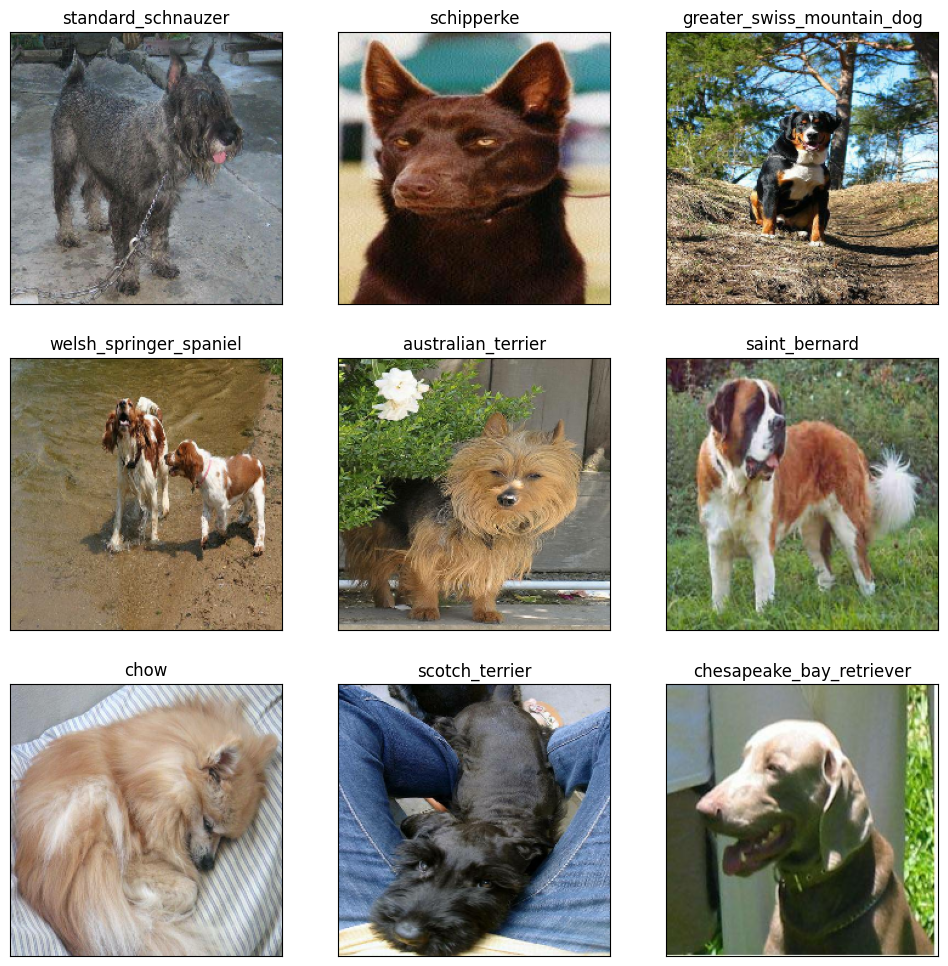

In [39]:
plt.figure(figsize=(12, 12))
for i, image in enumerate(img_arr):
  plt.subplot(3, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(labels_pred[i])
  plt.imshow(image)